In [1]:
import os
os.environ['CUDA_DEVICE_ORDER'] = 'PCI_BUS_ID'
os.environ['CUDA_VISIBLE_DEVICES'] = '2'

In [2]:
import numpy as np
import pandas as pd

# import tqdm.notebook as tq
import tqdm as tq

import random

import torch
import torch.nn as nn

from torch.utils.data import Dataset, DataLoader

from sklearn.preprocessing import OneHotEncoder

import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [30, 10]

In [3]:
random_seed = 13

torch.manual_seed(random_seed)
random.seed(random_seed)
np.random.seed(random_seed)

In [4]:
dataset = 'FordB'

from sktime.datasets import load_UCR_UEA_dataset

X_train, y_train = load_UCR_UEA_dataset(name=dataset, split='train', return_type='numpyflat')
X_test, y_test = load_UCR_UEA_dataset(name=dataset, split='test', return_type='numpyflat')

In [5]:
print(f'Length training data: {len(X_train)} labels: {len(y_train)} test data: {len(X_test)} labels: {len(y_test)}')

Length training data: 3636 labels: 3636 test data: 810 labels: 810


In [6]:
encoder = OneHotEncoder(categories='auto', sparse_output=False)

y_train_ohe = encoder.fit_transform(np.expand_dims(y_train, axis=-1))
y_test_ohe = encoder.transform(np.expand_dims(y_test, axis=-1))

y_train_norm = y_train_ohe.argmax(axis=-1)
y_test_norm = y_test_ohe.argmax(axis=-1)

In [7]:
class FordADataset(Dataset):

    def __init__(self, X, y):
        self.X = X
        self.y = y
    
    def __len__(self):
        return len(self.X)
    
    def __getitem__(self, idx):
        inputs = self.X[idx]
        label = self.y[idx]
        
        return inputs, label

In [8]:
dataset_train = FordADataset(X_train, y_train_ohe)
dataset_test = FordADataset(X_test, y_test_ohe)

In [9]:
dataloader_train = DataLoader(dataset_train, batch_size=120, shuffle=True)
dataloader_train_not_shuffled = DataLoader(dataset_train, batch_size=120, shuffle=False)
dataloader_test = DataLoader(dataset_test, batch_size=120, shuffle=False)

In [10]:
import torch
from torch import nn
import torch.nn.functional as F


class Conv1dSamePadding(nn.Conv1d):
    """Represents the "Same" padding functionality from Tensorflow.
    See: https://github.com/pytorch/pytorch/issues/3867
    Note that the padding argument in the initializer doesn't do anything now
    """
    def forward(self, input):
        kernel, dilation, stride = self.weight.size(2), self.dilation[0], self.stride[0]
        
        l_out = l_in = input.size(2)
    
        padding = (((l_out - 1) * stride) - l_in + (dilation * (kernel - 1)) + 1)
        if padding % 2 != 0:
            input = F.pad(input, [0, 1])

        return F.conv1d(input=input, weight=self.weight, bias=self.bias, stride=stride, padding=padding // 2, dilation=dilation, groups=self.groups)


class ResNetBlock(nn.Module):

    def __init__(self, in_channels, out_channels):
        super().__init__()

        channels = [in_channels, out_channels, out_channels, out_channels]
        kernel_sizes = [5, 3, 1]

        layers = []
        for i in range(len(kernel_sizes)):
            layers += [
                Conv1dSamePadding(in_channels=channels[i], out_channels=channels[i + 1], kernel_size=kernel_sizes[i], stride=1),
                nn.BatchNorm1d(num_features=channels[i + 1]),
                nn.ReLU(),
            ]
        self.layers = nn.Sequential(*layers)

        self.match_channels = False
        if in_channels != out_channels:
            self.match_channels = True
            self.residual = nn.Sequential(*[
                Conv1dSamePadding(in_channels=in_channels, out_channels=out_channels, kernel_size=1, stride=1),
                nn.BatchNorm1d(num_features=out_channels)
            ])

    def forward(self, x):
        if self.match_channels:
            return self.layers(x) + self.residual(x)
        return self.layers(x)


class ResNet(nn.Module):
    def __init__(self):
        super().__init__()
        
        num_pred_classes = 2
        in_channels = 1
        mid_channels = 10
        
        self.layers = nn.Sequential(*[
            ResNetBlock(in_channels=in_channels, out_channels=mid_channels),
            ResNetBlock(in_channels=mid_channels, out_channels=mid_channels * 2),
            ResNetBlock(in_channels=mid_channels * 2, out_channels=mid_channels * 2),

        ])
        self.fc = nn.Sequential(
            nn.Linear(mid_channels * 2, num_pred_classes),
            nn.Softmax(-1)
        )

        
    def forward(self, x):
        x = self.layers(x)
        x = x.mean(dim=-1)
        x = self.fc(x)
        
        return x

# Training of the model

In [11]:
def trainer(model, dataloader_train, criterion):
    running_loss = 0

    model.train()

    for idx, (inputs, labels) in enumerate(dataloader_train):
        inputs = inputs.reshape(inputs.shape[0], 1, -1)
        inputs = inputs.float().to(device)
        labels = labels.float().to(device)

        optimizer.zero_grad()
        preds = model(inputs)
        loss = criterion(preds, labels.argmax(dim=-1))
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()

    train_loss = running_loss / len(dataloader_train)
    
    return train_loss


def validator(model, dataloader_test, criterion):
    running_loss = 0

    model.eval()

    for idx, (inputs, labels) in enumerate(dataloader_test):
        inputs = inputs.reshape(inputs.shape[0], 1, -1)
        inputs = inputs.float().to(device)
        labels = labels.float().to(device)

        preds = model(inputs)
        loss = criterion(preds, labels.argmax(dim=-1))
        
        running_loss += loss.item()

    train_loss = running_loss / len(dataloader_train)
    
    return train_loss

In [12]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = ResNet().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
loss = nn.CrossEntropyLoss()

In [13]:
epochs = 500

for epoch in range(epochs):
    train_loss = trainer(model, dataloader_train, loss)
    if epoch % 10 == 0:
        print('Val', validator(model, dataloader_test, loss))
        print('Train', train_loss)

Val 0.15631545743634623
Train 0.6768128583508153
Val 0.14891424294440977
Train 0.5392684571204647
Val 0.14066704050187143
Train 0.4829387385999003
Val 0.13482189370739844
Train 0.4556916855996655
Val 0.13201053680912142
Train 0.44039200198265815
Val 0.1287295779874248
Train 0.42864364962424
Val 0.12690022299366613
Train 0.41936783732906463
Val 0.12469019620649276
Train 0.4136201354765123
Val 0.12309731398859332
Train 0.40757831642704623
Val 0.1228766345208691
Train 0.40397579246951687
Val 0.12093275208627025
Train 0.40166058559571544
Val 0.12060847782319592
Train 0.3978076740618675
Val 0.11748399945997423
Train 0.3928802119147393
Val 0.11946726422156057
Train 0.39029086309094585
Val 0.1187588918593622
Train 0.38907503120360837
Val 0.1179113099651952
Train 0.386730654585746
Val 0.11626860114835924
Train 0.38281076281301435
Val 0.11619514899869118
Train 0.38212431053961476
Val 0.11660741413793256
Train 0.37895344534227926
Val 0.11714319356026189
Train 0.37588815727541525
Val 0.1153628047

In [14]:
model.eval()

preds = []
labels = []
for x in dataloader_train_not_shuffled:
    input_, label_ = x
    input_ = input_.reshape(input_.shape[0], 1, -1)
    input_ = input_.float().to(device)
    label_ = label_.float().to(device)

    pred_ = model(input_)
    preds.extend(pred_)
    labels.extend(label_)

preds = torch.stack(preds)
labels = torch.stack(labels)
print('Prediction Accuracy Train', np.round((preds.argmax(dim=-1) == labels.argmax(dim=-1)).int().sum().float().item() / len(preds), 4))

y_train_pred = preds.cpu().detach().numpy().round(3)

Prediction Accuracy Train 0.9794


In [15]:
model.eval()

preds = []
labels = []
for x in dataloader_test:
    input_, label_ = x
    input_ = input_.reshape(input_.shape[0], 1, -1)
    input_ = input_.float().to(device)
    label_ = label_.float().to(device)

    pred_ = model(input_)
    preds.extend(pred_)
    labels.extend(label_)

preds = torch.stack(preds)
labels = torch.stack(labels)
print('Prediction Accuracy Test', np.round((preds.argmax(dim=-1) == labels.argmax(dim=-1)).int().sum().float().item() / len(preds), 4))

y_test_pred = preds.cpu().detach().numpy().round(3)

Prediction Accuracy Test 0.8099


# Save results as json

In [16]:
%load_ext autoreload
%autoreload 2

In [17]:
import exp_perturbation_analysis as exp_pa

import exp_stability_indicator as exp_si

import exp_plots as exp_pl

import scipy as sp

In [18]:
from captum.attr import GradientShap, DeepLiftShap, IntegratedGradients, ShapleyValueSampling, Saliency, DeepLift

In [19]:
import matplotlib as mpl

cmap = 'tab10'

In [20]:
attribution_measure = exp_si.attribution_stability_indicator
get_asi_for_dataset = exp_si.get_asi_for_dataset

In [21]:
sample_idx = 0
sample_ts_np, sample_l = dataloader_test.dataset[sample_idx]

sample, label = dataset_train[0]
shape = sample_ts_np.reshape(1, -1).shape

baselines = torch.from_numpy(np.array([dataset_test[torch.randint(len(dataset_test), (1,))][0] for _ in range(10)])).reshape(-1, *shape).float().to(device)



attribution_techniques = [
    ['Saliency', Saliency, {}],
    ['GradientShap', GradientShap, {'baselines': baselines}],
    
    ['DeepLift', DeepLift, {}],
    ['DeepLiftShap', DeepLiftShap, {'baselines': baselines}],
    
    ['IntegratedGradients', IntegratedGradients, {}],
    
#     ['ShapleyValueSampling', ShapleyValueSampling, {}],
]

for at in tq.tqdm(attribution_techniques):
    at_name, at_class, at_kwargs = at
    asi_core_tmp = attribution_measure(model, sample_ts_np, sample_l, at_class, at_kwargs, debug=True, weights=[0.5, 1, 0.5, 3], perturbation_fnc=exp_pa.delete_to_zero)

  0%|          | 0/5 [00:00<?, ?it/s]/home/schlegel/.conda/captum/lib/python3.10/site-packages/captum/_utils/gradient.py:57: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  warnings.warn(
/home/schlegel/.conda/captum/lib/python3.10/site-packages/captum/attr/_core/deep_lift.py:304: UserWarning: Setting forward, backward hooks and attributes on non-linear
               activations. The hooks and attributes will be removed
            after the attribution is finished
  warnings.warn(
 60%|██████    | 3/5 [00:00<00:00, 24.03it/s]

XAI: Saliency
Original Pred:  [4.30000e-05 9.99957e-01]
Perturbed Pred: [0.754671 0.245329]

TS Correl: 0.04004107785243627
Att Correl: 0.5415571703692088

Labels
TL  P1  Pd
 1   1   0

ASI
0.38009

XAI: GradientShap
Original Pred:  [4.30000e-05 9.99957e-01]
Perturbed Pred: [9.99774e-01 2.26000e-04]

TS Correl: 0.17266427969836173
Att Correl: 0.534092661117662

Labels
TL  P1  Pd
 1   1   0

ASI
0.33791

XAI: DeepLift
Original Pred:  [4.30000e-05 9.99957e-01]
Perturbed Pred: [0.997979 0.002021]

TS Correl: 0.29277613791438395
Att Correl: 0.5555938406803009

Labels
TL  P1  Pd
 1   1   0

ASI
0.36372

XAI: DeepLiftShap
Original Pred:  [4.30000e-05 9.99957e-01]
Perturbed Pred: [9.99785e-01 2.15000e-04]

TS Correl: 0.21077240362305738
Att Correl: 0.520579031034827

Labels
TL  P1  Pd
 1   1   0

ASI
0.33361



100%|██████████| 5/5 [00:00<00:00, 20.36it/s]

XAI: IntegratedGradients
Original Pred:  [4.30000e-05 9.99957e-01]
Perturbed Pred: [0.977841 0.022159]

TS Correl: 0.2805240659667746
Att Correl: 0.5314513983412557

Labels
TL  P1  Pd
 1   1   0

ASI
0.35482



In [22]:
loader = dataloader_train_not_shuffled
ret_train = get_asi_for_dataset(loader, model, attribution_techniques, [0.5, 1, 0.5, 3], exp_pa.delete_to_zero)

  2%|▏         | 64/3636 [00:17<15:47,  3.77it/s]/home/schlegel/.conda/captum/lib/python3.10/site-packages/scipy/spatial/distance.py:1300: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(js / 2.0)
100%|██████████| 3636/3636 [16:36<00:00,  3.65it/s]


In [23]:
loader = dataloader_test
ret_test = get_asi_for_dataset(loader, model, attribution_techniques, [0.5, 1, 0.5, 3], exp_pa.delete_to_zero)

100%|██████████| 810/810 [03:08<00:00,  4.30it/s]


In [24]:
generate_projections = exp_pl.generate_projections
generate_histogram = exp_pl.generate_histogram

Name: Saliency
ASI: 1822.556, Flips: 1722


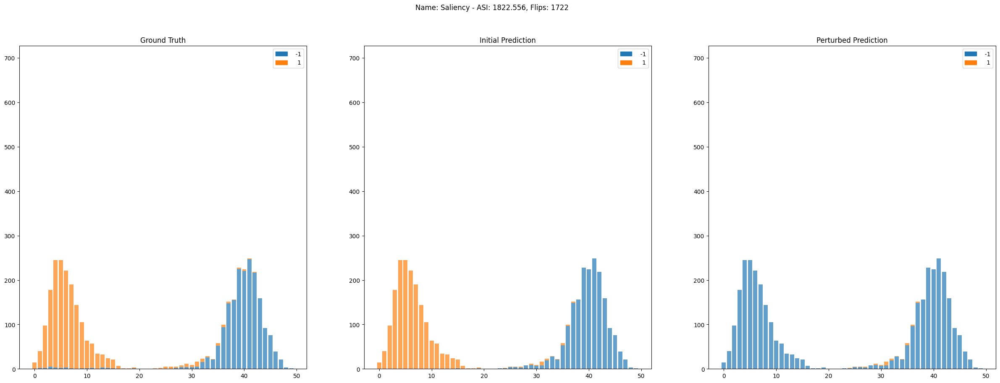

Name: GradientShap
ASI: 1731.890, Flips: 1754


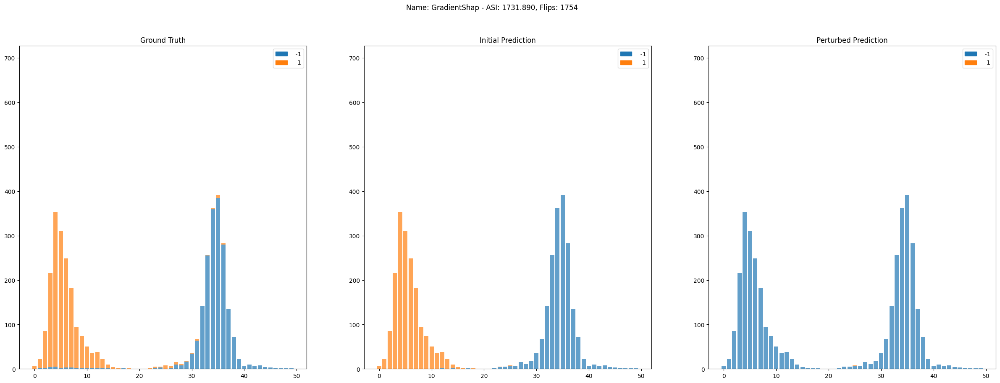

Name: DeepLift
ASI: 1827.341, Flips: 1753


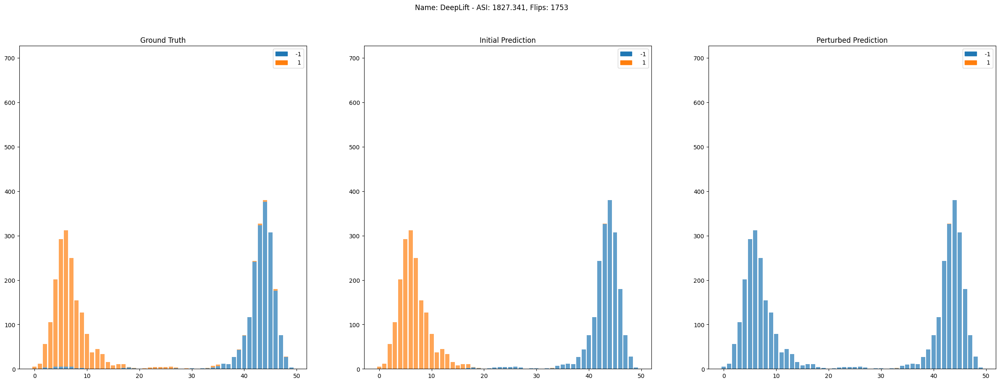

Name: DeepLiftShap
ASI: 1843.365, Flips: 1755


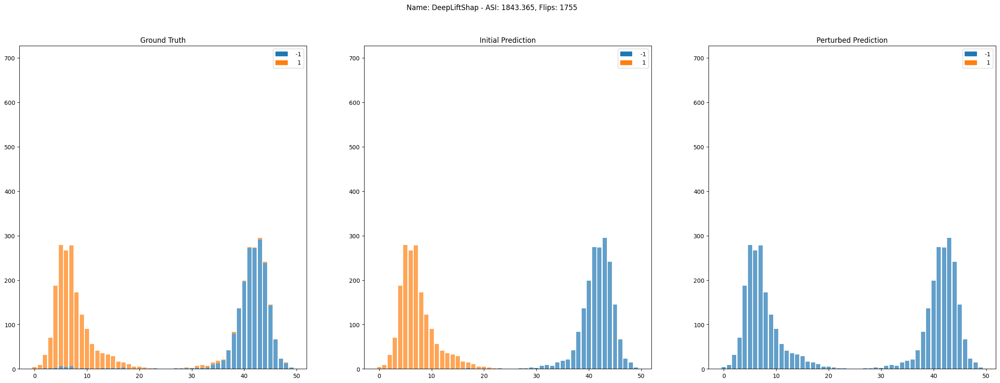

Name: IntegratedGradients
ASI: 1825.218, Flips: 1730


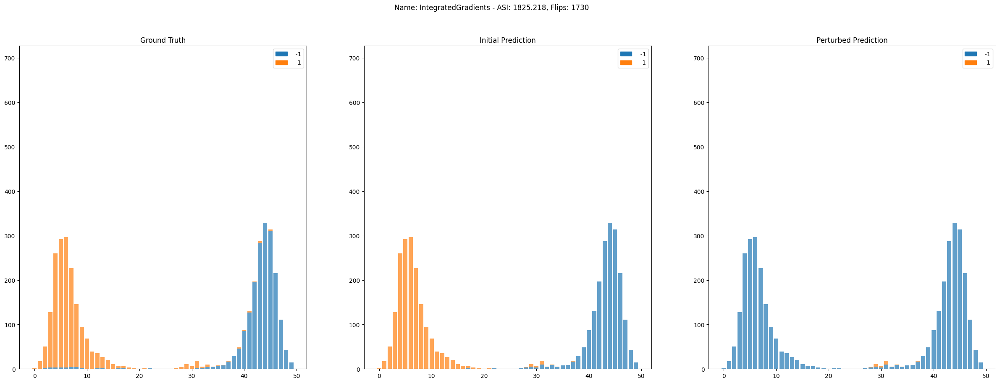

In [25]:
generate_histogram(ret_train, labels=list(np.unique(y_train)))

Name: Saliency
ASI: 1822.556, Flips: 1722


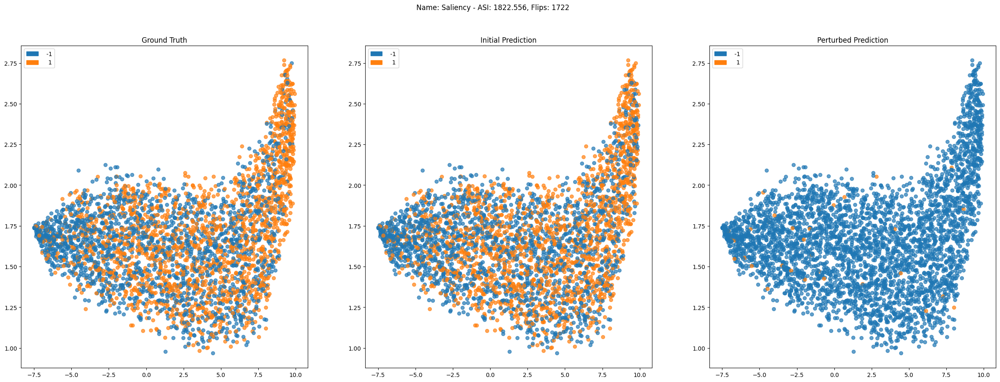

Name: GradientShap
ASI: 1731.890, Flips: 1754


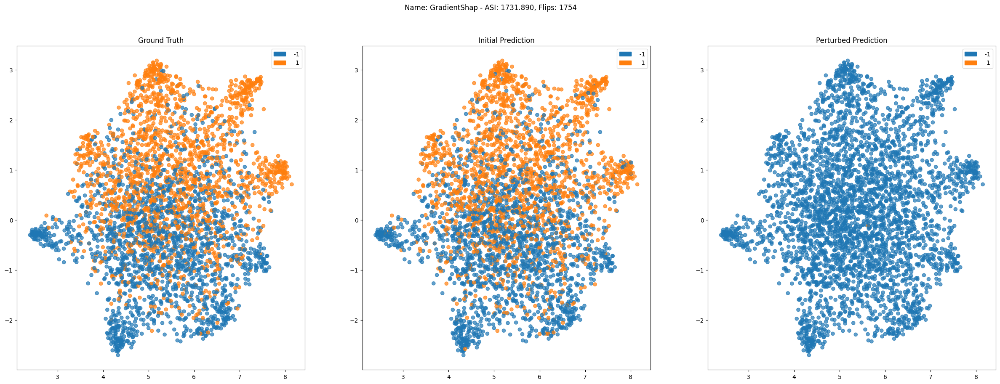

Name: DeepLift
ASI: 1827.341, Flips: 1753


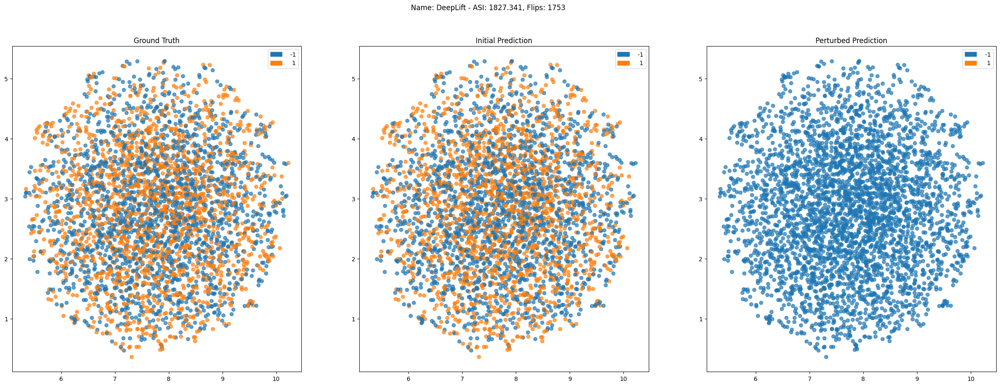

Name: DeepLiftShap
ASI: 1843.365, Flips: 1755


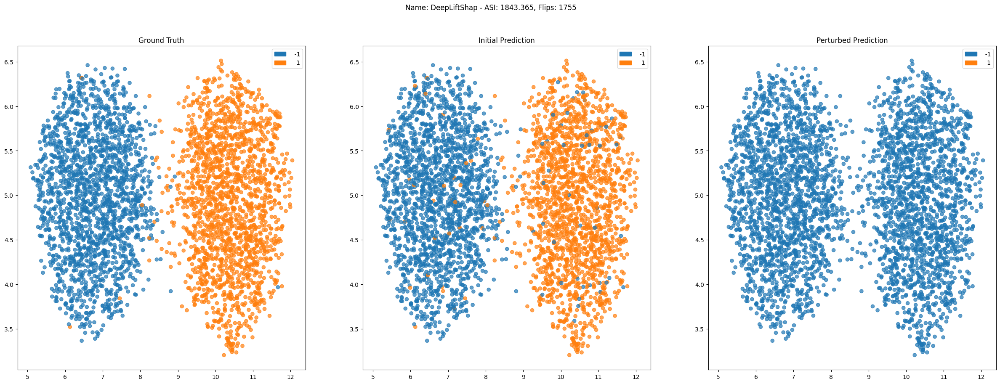

Name: IntegratedGradients
ASI: 1825.218, Flips: 1730


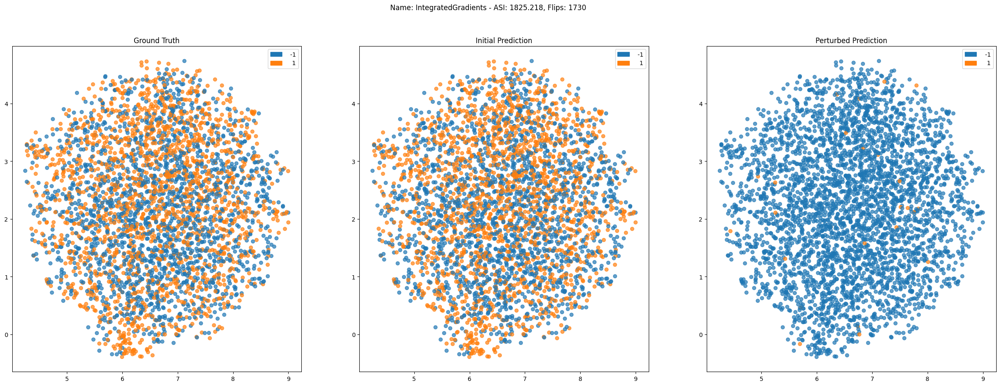

In [26]:
generate_projections(ret_train, labels=list(np.unique(y_train)))

Name: Saliency
ASI: 404.069, Flips: 351


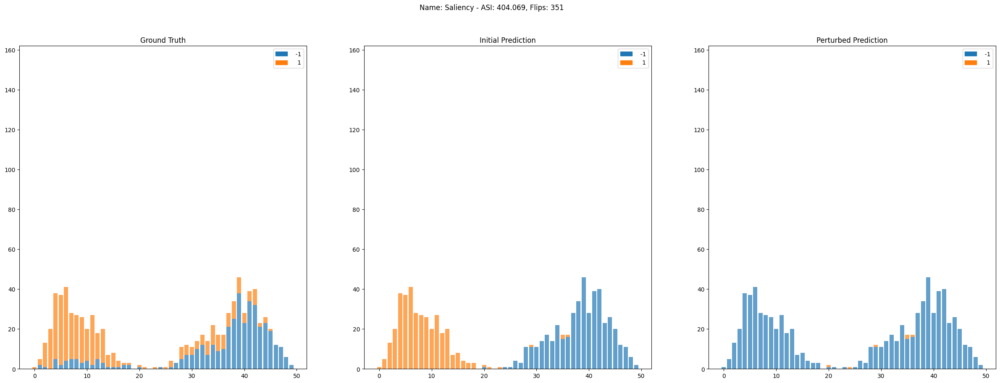

Name: GradientShap
ASI: 390.555, Flips: 352


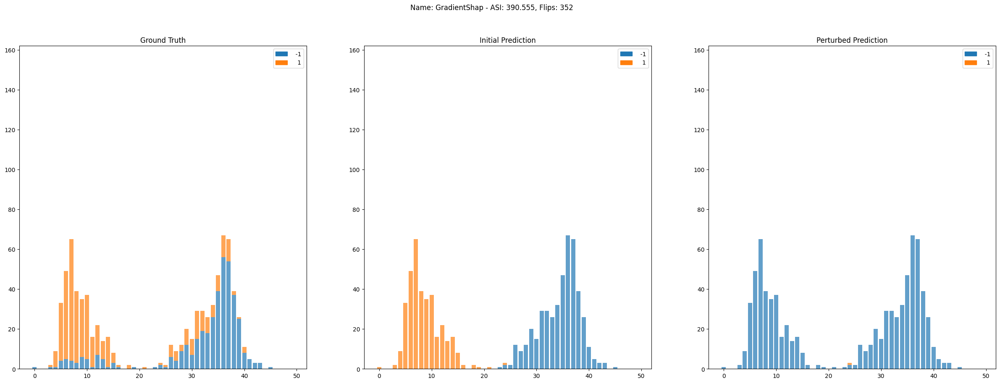

Name: DeepLift
ASI: 410.117, Flips: 354


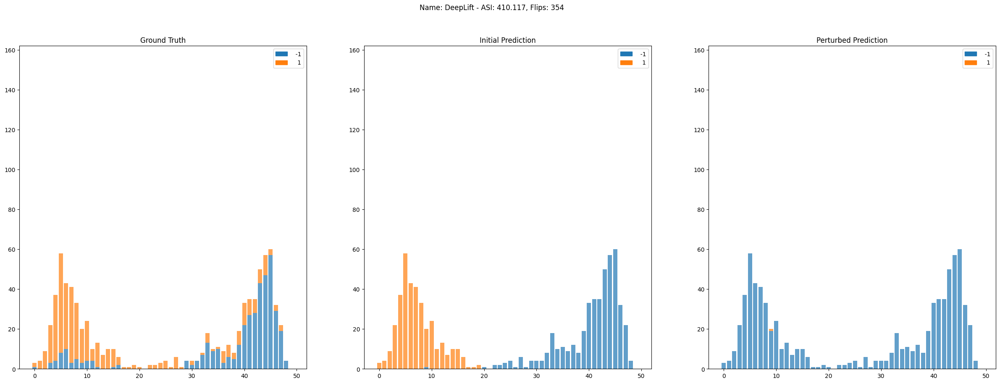

Name: DeepLiftShap
ASI: 419.181, Flips: 354


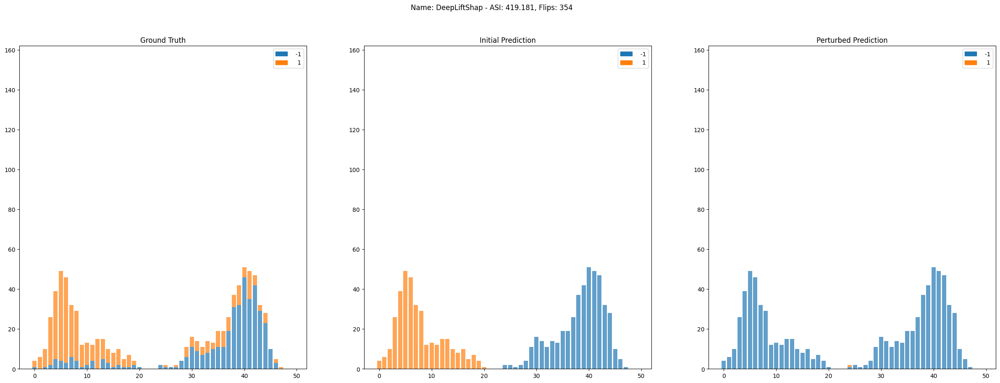

Name: IntegratedGradients
ASI: 407.821, Flips: 352


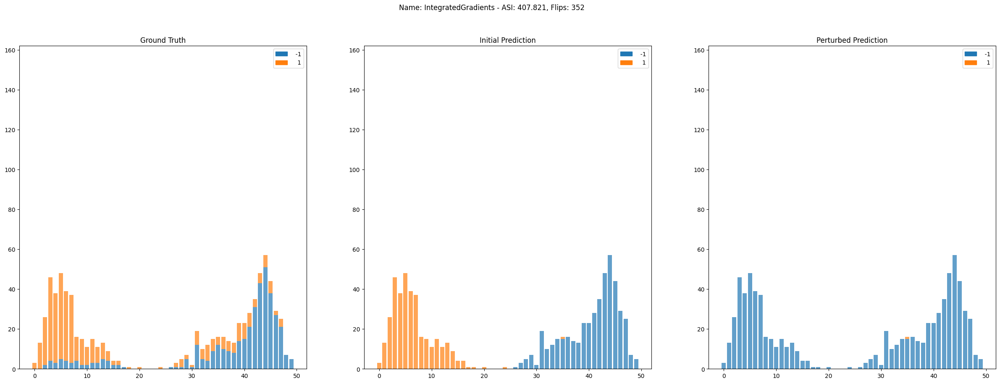

In [27]:
generate_histogram(ret_test, labels=list(np.unique(y_train)))

Name: Saliency
ASI: 404.069, Flips: 351


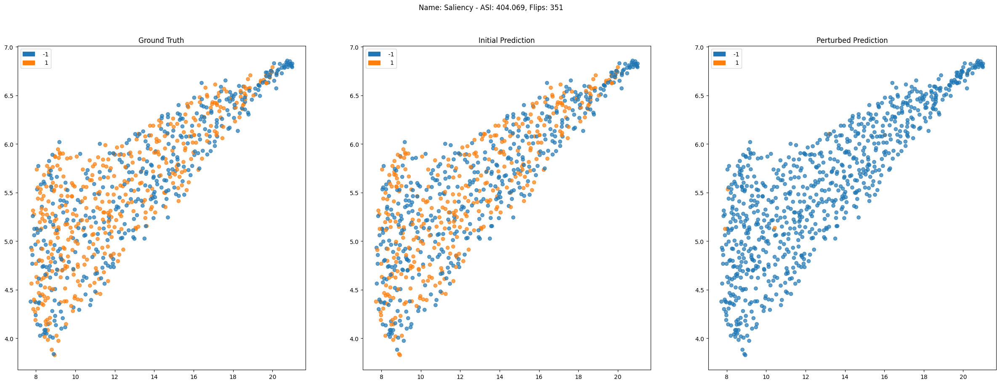

Name: GradientShap
ASI: 390.555, Flips: 352


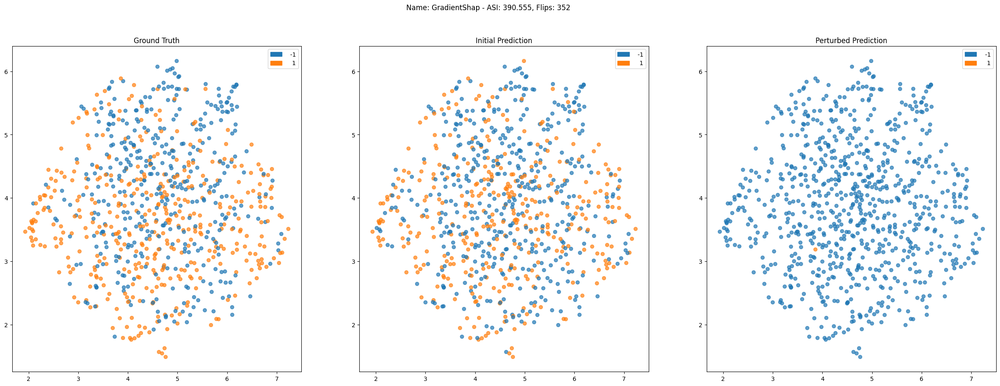

Name: DeepLift
ASI: 410.117, Flips: 354


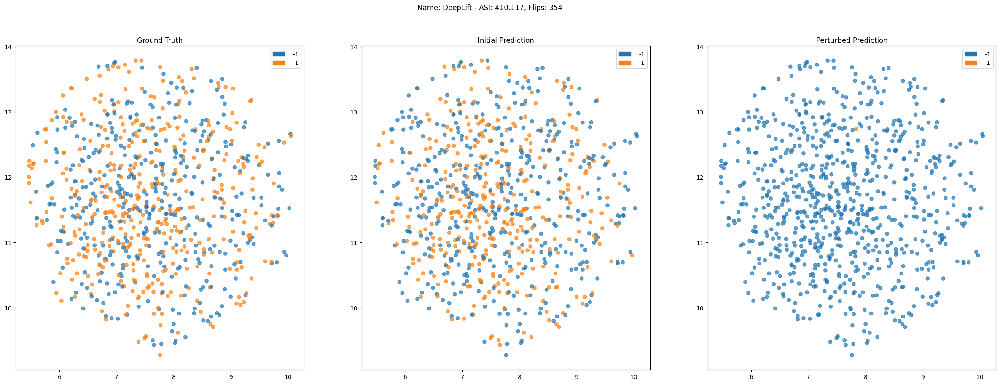

Name: DeepLiftShap
ASI: 419.181, Flips: 354


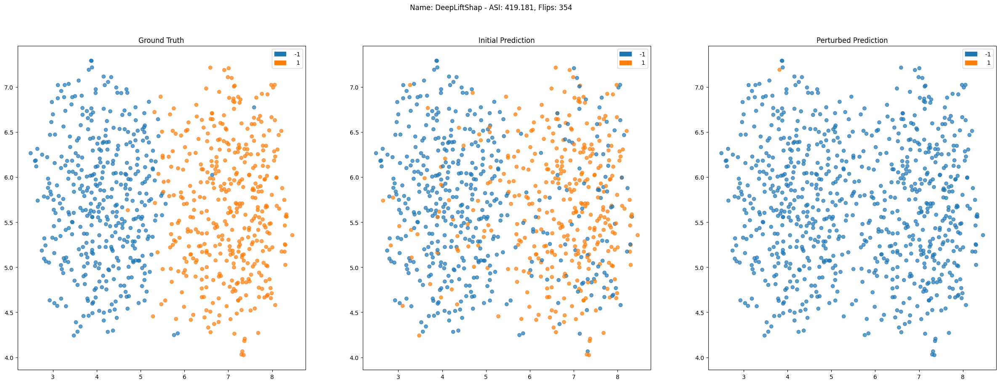

Name: IntegratedGradients
ASI: 407.821, Flips: 352


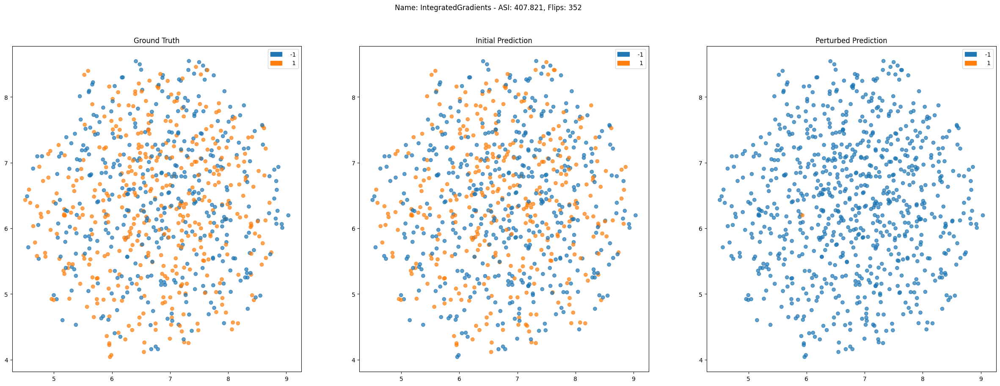

In [28]:
generate_projections(ret_test, labels=list(np.unique(y_train)))

In [ ]:
torch.save(model, 'models/ford-b-resnet.pth')